# AASD4015 - Advanced Mathematical Concepts for Deep Learning

## Project: Analyze Residual Blocks & Upsampling Blocks for Enhanced Deep Residual Networks


### Team Members:
- Khandaker Nahid Mahmud (101427435)
- Siddhant Gite (101359755)

# Problem Statement: 

Image super-resolution (SR), particularly single image super-resolution (SISR) aims to reconstruct a high-resolution image from a single low-resolution image. Recent research on super-resolution has progressed with the development of deep convolutional neural networks (DCNN). In particular, residual learning techniques exhibit improved performance.

In the paper [Enhanced Deep Residual Networks for Single Image Super-Resolution (EDSR)](https://arxiv.org/abs/1707.02921) Bee Lim et. al proposed the EDSR architecture, which is based on the SRResNet architecture.

In this project we implement the base single-scale model proposed in the paper and try to study the effect of Residual blocks and Upsampling blocks on image quality and training time. We analyzed the performance by changing the following parameters:

* Number of Residual blocks           
* Types of Upsampling blocks - Sub-Pixel CNN, Conv2DTranspose & UpSampling2D


# Introduction

The EDSR architecture is based on the SRResNet architecture and consists of multiple residual blocks. It uses constant  scaling layers instead of batch normalization layers to produce consistent results.

The residual block design of EDSR also differs from that of ResNet. Batch normalization layers have been removed (together with the final ReLU activation), since batch normalization layers normalize the features, they hurt output value range flexibility. It is thus better to remove them. Further, it also helps to reduce the amount of GPU RAM required by the model, since the batch normalization layers consume the same amount of memory as the preceding convolutional layers.

Reference: https://sh-tsang.medium.com/review-edsr-mdsr-enhanced-deep-residual-networks-for-single-image-super-resolution-super-4364f3b7f86f

**Modified Residual Blocks**

<img src="https://miro.medium.com/max/1050/1*EPviXGqlGWotVtV2gqVvNg.png" width="500" />


Apart from the residual blocks, another component of the architecture are the upsampling blocks. There are several strategies for upsampling and we explored the following:
1. Sub-Pixel CNN 
2. Conv2DTranspose 
3. UpSampling2D

We learned the concepts from the following articles and videos: 

https://www.analyticsvidhya.com/blog/2021/05/deep-learning-for-image-super-resolution/                    
http://krasserm.github.io/2019/09/04/super-resolution/                     
https://www.youtube.com/watch?v=fMwti6zFcYY&ab_channel=DigitalSreeni                  
https://towardsdatascience.com/types-of-convolutions-in-deep-learning-717013397f4d          


#### 1. Sub-Pixel CNN:
Given an input of size H×W×C and an upsampling factor s, the sub-pixel convolution layer first creates a representation of size H×W×s<sup>2</sup>C via a convolution operation and then reshapes it to sH×sW×C, completing the upsampling operation. The result is an output spatially scaled by factor s.

<img src="https://editor.analyticsvidhya.com/uploads/15959upsampling%20(3).JPG" width="500" />


#### 2. Transposed convolution:
Transposed convolution layer, tries to perform transformation opposite a normal convolution, i.e. predicting the possible  input based on feature maps sized like convolution output. Specifically, it increases the image resolution by expanding the image by inserting zeros and performing convolution.

<img src="https://editor.analyticsvidhya.com/uploads/55446upsampling%20(2).JPG" width="500" />


#### 3. Upsampling2D:
UpSampling2D is just a simple scaling up of the image by using nearest neighbour or bilinear upsampling. Advantage is it's cheap

<img src="https://i.imgur.com/UhwUfj0.png" width="500" />


The performance of the models are measured by the quality of generated images. To quantify reconstruction quality for images, Peak signal-to-noise ratio (PSNR) is measured and compared. 

# Dataset

### DIV2K:

We used the same dataset used in the paper - DIV2K. This is a popular single-image super-resolution dataset which contains 1,000 images with different scenes and is splitted to 800 for training, 100 for validation and 100 for testing. It was collected for NTIRE2017 and NTIRE2018 Super-Resolution Challenges in order to encourage research on image super-resolution with more realistic degradation. This dataset contains low resolution images with different types of degradations. Apart from the standard bicubic downsampling, several types of degradations are considered in synthesizing low resolution images for different tracks of the challenges. 


The dataset is available in tensorflow datasets: https://www.tensorflow.org/datasets/catalog/div2k


# Summary of Findings

INSERT TABLE

# Reference Notebook:

The EDSR notebook from Keras website is taken as reference to implement the base model. Then we experminted with various combinations of Rasidual Blocks and Upsampling Blocks. 

https://keras.io/examples/vision/edsr/

## Imports

In [1]:
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers

AUTOTUNE = tf.data.AUTOTUNE

## Download the training dataset

We use 4x bicubic downsampled images as our "low quality" reference from the tensorflow DIV2K dataset

In [2]:
# Download DIV2K from TF Datasets
# Using bicubic 4x degradation type
div2k_data = tfds.image.Div2k(config="bicubic_x4")
div2k_data.download_and_prepare()

# Taking train data from div2k_data object
train = div2k_data.as_dataset(split="train", as_supervised=True)
train_cache = train.cache()
# Validation data
val = div2k_data.as_dataset(split="validation", as_supervised=True)
val_cache = val.cache()

EXTRACTING {'train_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X4.zip', 'valid_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X4.zip', 'train_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip', 'valid_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip'}


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/800 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0.incomplete5ZY3T7/div2k-train.tfrecord*...:   0%|   …

Generating validation examples...:   0%|          | 0/100 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0.incomplete5ZY3T7/div2k-validation.tfrecord*...:   0…

Dataset div2k downloaded and prepared to /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0. Subsequent calls will reuse this data.


## Flip, crop and resize images

In [3]:
def flip_left_right(lowres_img, highres_img):
    """Flips Images to left and right."""

    # Outputs random values from a uniform distribution in between 0 to 1
    rn = tf.random.uniform(shape=(), maxval=1)
    # If rn is less than 0.5 it returns original lowres_img and highres_img
    # If rn is greater than 0.5 it returns flipped image
    return tf.cond(
        rn < 0.5,
        lambda: (lowres_img, highres_img),
        lambda: (
            tf.image.flip_left_right(lowres_img),
            tf.image.flip_left_right(highres_img),
        ),
    )


def random_rotate(lowres_img, highres_img):
    """Rotates Images by 90 degrees."""

    # Outputs random values from uniform distribution in between 0 to 4
    rn = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    # Here rn signifies number of times the image(s) are rotated by 90 degrees
    return tf.image.rot90(lowres_img, rn), tf.image.rot90(highres_img, rn)


def random_crop(lowres_img, highres_img, hr_crop_size=96, scale=4):
    """Crop images.

    low resolution images: 24x24
    high resolution images: 96x96
    """
    lowres_crop_size = hr_crop_size // scale  # 96//4=24
    lowres_img_shape = tf.shape(lowres_img)[:2]  # (height,width)

    lowres_width = tf.random.uniform(
        shape=(), maxval=lowres_img_shape[1] - lowres_crop_size + 1, dtype=tf.int32
    )
    lowres_height = tf.random.uniform(
        shape=(), maxval=lowres_img_shape[0] - lowres_crop_size + 1, dtype=tf.int32
    )

    highres_width = lowres_width * scale
    highres_height = lowres_height * scale

    lowres_img_cropped = lowres_img[
        lowres_height : lowres_height + lowres_crop_size,
        lowres_width : lowres_width + lowres_crop_size,
    ]  # 24x24
    highres_img_cropped = highres_img[
        highres_height : highres_height + hr_crop_size,
        highres_width : highres_width + hr_crop_size,
    ]  # 96x96

    return lowres_img_cropped, highres_img_cropped


## Prepare a `tf.data.Dataset` object

We augment the training data with random horizontal flips and 90 rotations.

As low resolution images, we use 24x24 RGB input patches.

In [4]:
def dataset_object(dataset_cache, training=True):

    ds = dataset_cache
    ds = ds.map(
        lambda lowres, highres: random_crop(lowres, highres, scale=4),
        num_parallel_calls=AUTOTUNE,
    )

    if training:
        ds = ds.map(random_rotate, num_parallel_calls=AUTOTUNE)
        ds = ds.map(flip_left_right, num_parallel_calls=AUTOTUNE)
    # Batching Data
    ds = ds.batch(16)

    if training:
        # Repeating Data, so that cardinality if dataset becomes infinte
        ds = ds.repeat()
    # prefetching allows later images to be prepared while the current image is being processed
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds


train_ds = dataset_object(train_cache, training=True)
val_ds = dataset_object(val_cache, training=False)


## Visualize the data

Let's visualize a few sample images:

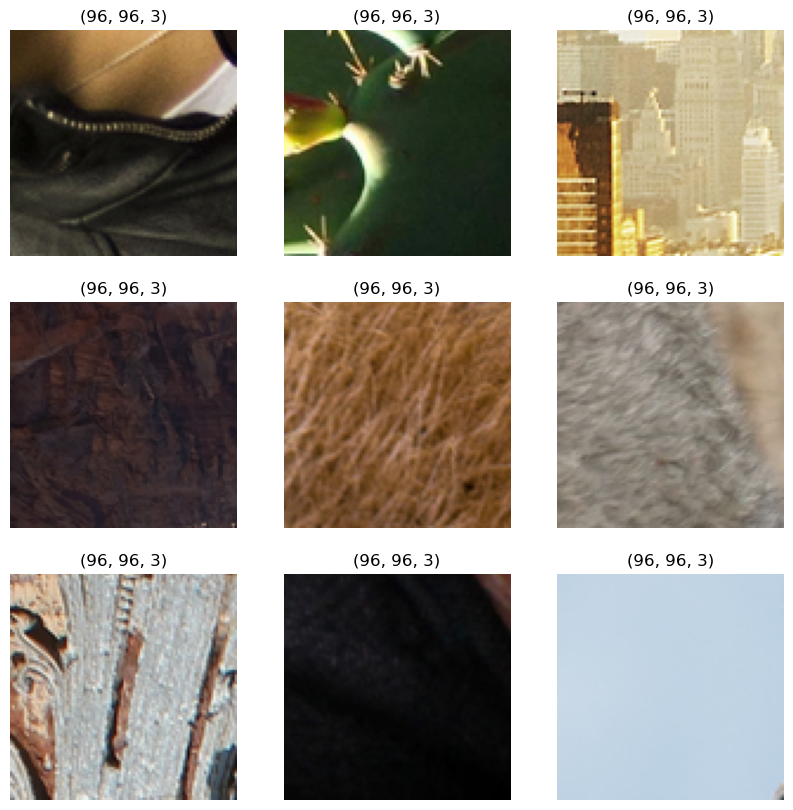

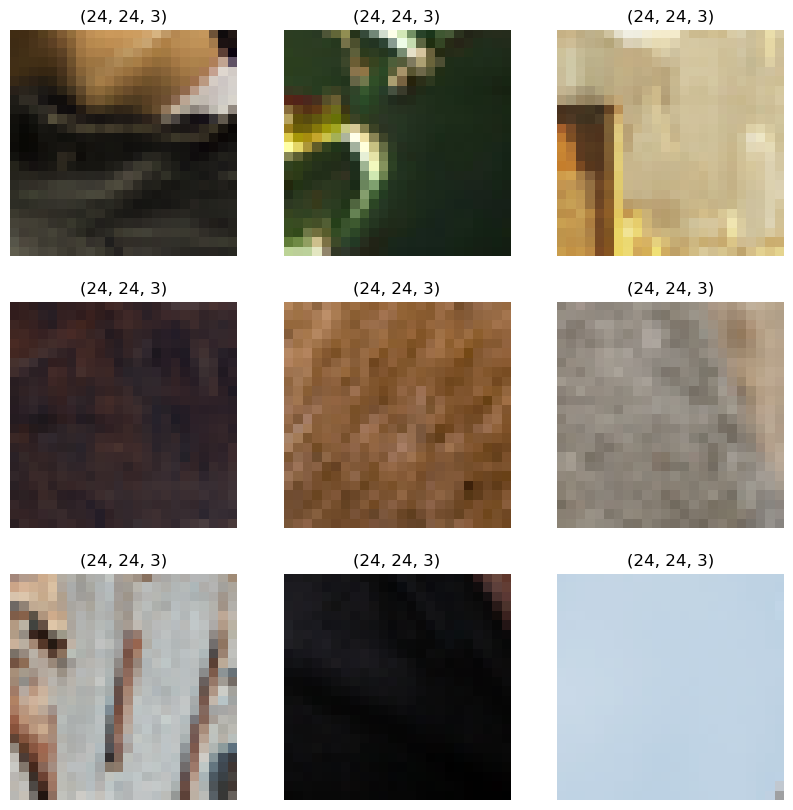

In [5]:
lowres, highres = next(iter(train_ds))

# High Resolution Images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(highres[i].numpy().astype("uint8"))
    plt.title(highres[i].shape)
    plt.axis("off")

# Low Resolution Images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(lowres[i].numpy().astype("uint8"))
    plt.title(lowres[i].shape)
    plt.axis("off")


## Model definitions and Training

In the paper, the authors train three models: EDSR, MDSR, and a baseline model. In this code example, we only train the baseline model.

## Peak signal-to-noise ratio (PSNR)

In [6]:
def PSNR(super_resolution, high_resolution):
    """Compute the peak signal-to-noise ratio, measures quality of image."""
    # Max value of pixel is 255
    psnr_value = tf.image.psnr(high_resolution, super_resolution, max_val=255)[0]
    return psnr_value

In [7]:
def plot_results(lowres, preds):
    """
    Displays low resolution image and super resolution image
    """
    plt.figure(figsize=(24, 14))
    plt.subplot(132), plt.imshow(lowres), plt.title("Low resolution")
    plt.subplot(133), plt.imshow(preds), plt.title("Prediction")
    plt.show()

## Build the Model

In [8]:
class EDSRModel(tf.keras.Model):
    def train_step(self, data):
        # Unpack the data. Its structure depends on your model and
        # on what you pass to `fit()`.
        x, y = data

        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)  # Forward pass
            # Compute the loss value
            # (the loss function is configured in `compile()`)
            loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

        # Compute gradients
        trainable_vars = self.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        # Update metrics (includes the metric that tracks the loss)
        self.compiled_metrics.update_state(y, y_pred)
        # Return a dict mapping metric names to current value
        return {m.name: m.result() for m in self.metrics}

    def predict_step(self, x):
        # Adding dummy dimension using tf.expand_dims and converting to float32 using tf.cast
        x = tf.cast(tf.expand_dims(x, axis=0), tf.float32)
        # Passing low resolution image to model
        super_resolution_img = self(x, training=False)
        # Clips the tensor from min(0) to max(255)
        super_resolution_img = tf.clip_by_value(super_resolution_img, 0, 255)
        # Rounds the values of a tensor to the nearest integer
        super_resolution_img = tf.round(super_resolution_img)
        # Removes dimensions of size 1 from the shape of a tensor and converting to uint8
        super_resolution_img = tf.squeeze(
            tf.cast(super_resolution_img, tf.uint8), axis=0
        )
        return super_resolution_img


## Residual Blocks

In [9]:
# Residual Block
def ResBlock(inputs):
    x = layers.Conv2D(64, 3, padding="same", activation="relu")(inputs)
    x = layers.Conv2D(64, 3, padding="same")(x)
    x = layers.Add()([inputs, x])
    return x

## Upsampling Blocks

In [10]:
# Upsampling Blocks- SubPixelConv, Conv2DTranspose, UpSampling2D
def Upsampling(inputs, upblock='SubPixelConv', factor=2, **kwargs):
    if upblock=='Conv2DTranspose':
        x = layers.Conv2DTranspose(64,3, strides=factor, padding="same")(inputs)
        x = layers.Conv2DTranspose(64,3, strides=factor, padding="same")(x)
    elif upblock=='UpSampling2D':
        x = layers.UpSampling2D(factor)(inputs)
        x = layers.UpSampling2D(factor)(x)
    else:
        # Sub-pixel convolution
        x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(inputs)
        # pixel shuffle
        x = tf.nn.depth_to_space(x, block_size=factor)
        x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(x)
        # pixel shuffle
        x = tf.nn.depth_to_space(x, block_size=factor)   
        
    return x

## Model generation function

In [11]:
def make_model(num_filters, num_of_residual_blocks, upblock='SubPixelConv'):
    """ 
    num_filters: Number of kernels
    num_of_residual_blocks: Number of residual block
    upblock: depth_to_space, Conv2DTranspose or UpSampling2D
    """
    # Flexible Inputs to input_layerConv2DTranspose
    input_layer = layers.Input(shape=(None, None, 3))
    # Scaling Pixel Values
    x = layers.Rescaling(scale=1.0 / 255)(input_layer)
    x = x_new = layers.Conv2D(num_filters, 3, padding="same")(x)

    # 16 residual blocks
    for _ in range(num_of_residual_blocks):
        x_new = ResBlock(x_new)

    x_new = layers.Conv2D(num_filters, 3, padding="same")(x_new)
    x = layers.Add()([x, x_new])

    x = Upsampling(x, upblock=upblock)
    x = layers.Conv2D(3, 3, padding="same")(x)

    output_layer = layers.Rescaling(scale=255)(x)
    return EDSRModel(input_layer, output_layer)

## Training Model variations

Train with Residual Blocks: 2 and Upsample method: Conv2DTranspose
Model: "edsr_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 rescaling (Rescaling)          (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   1792        ['rescaling[0][0]']              
                      

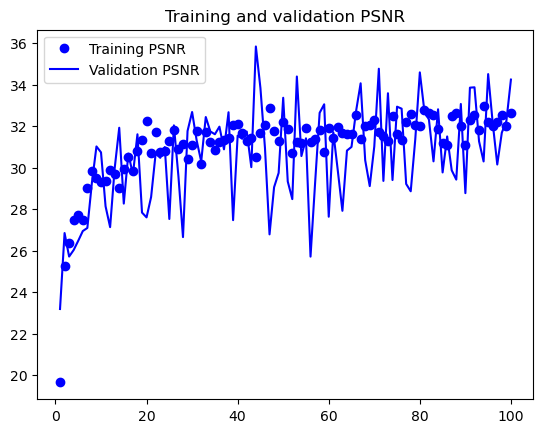

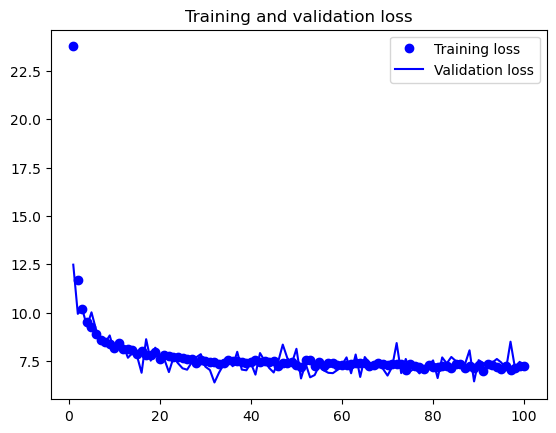

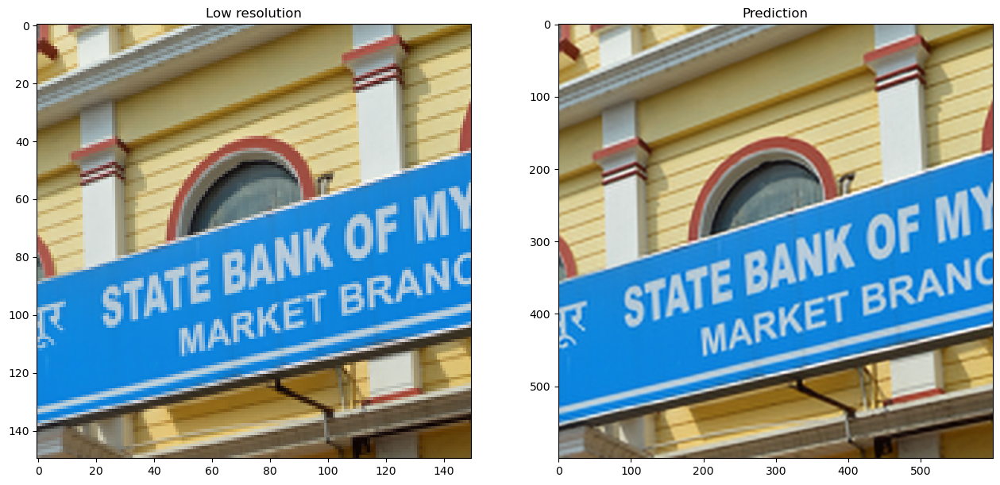

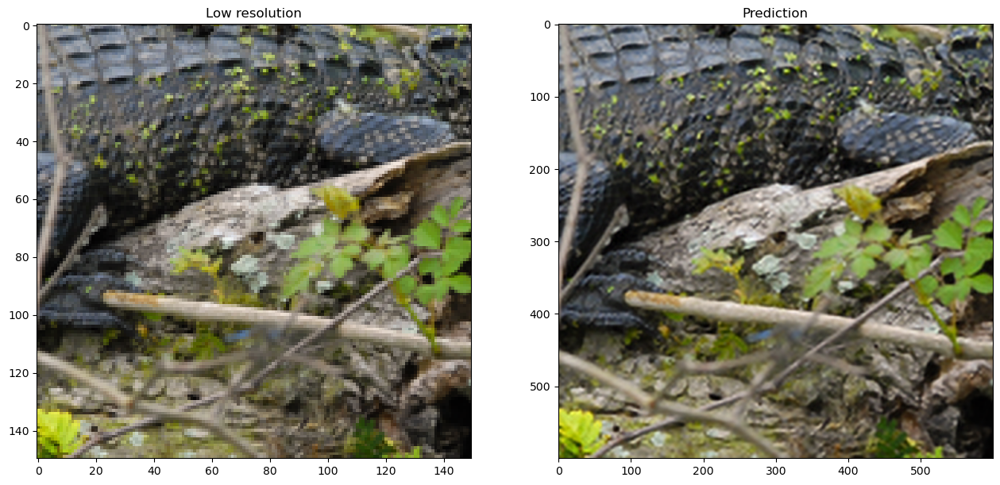

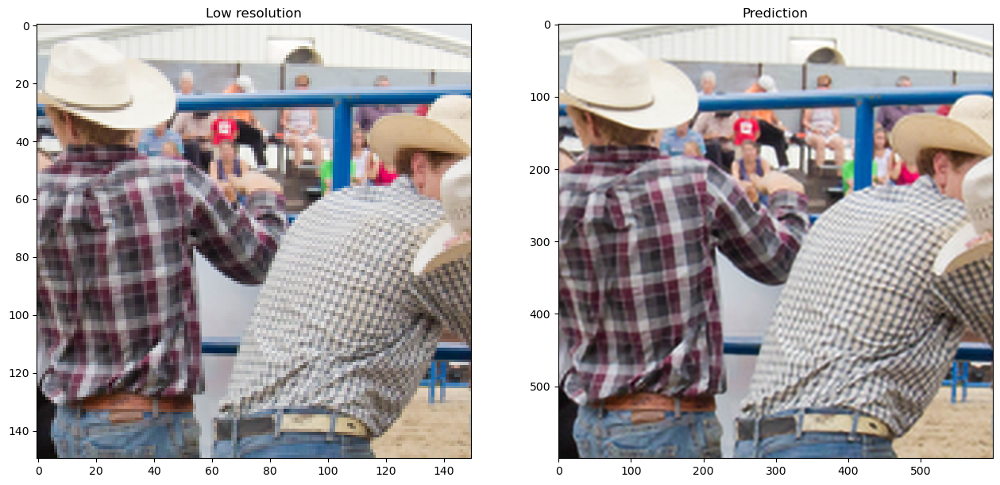

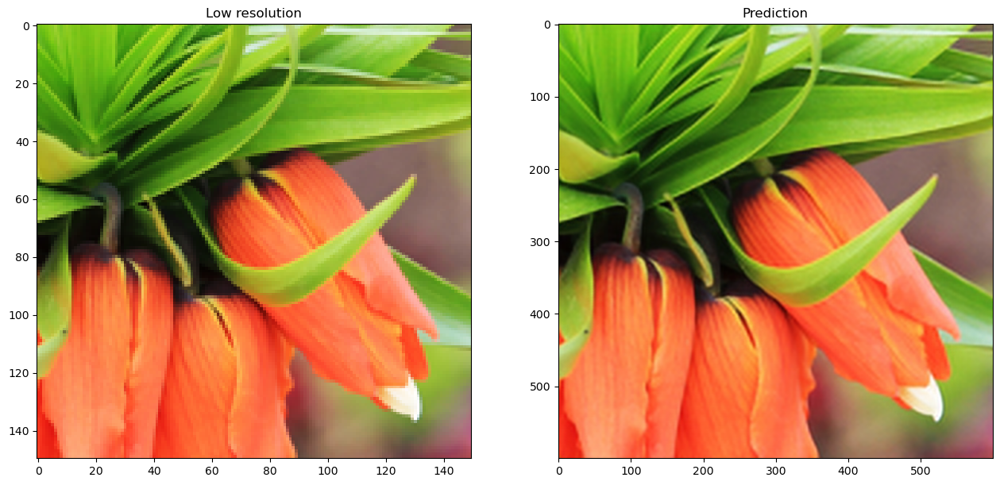

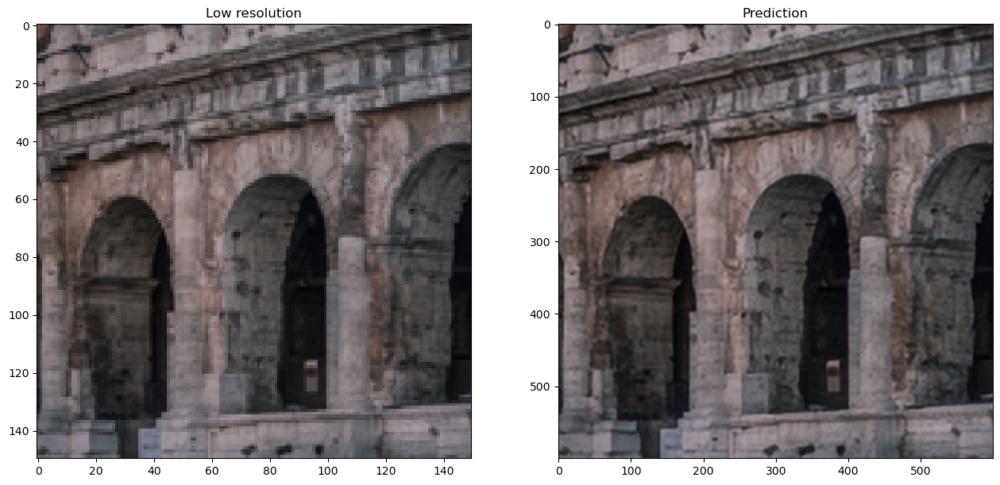

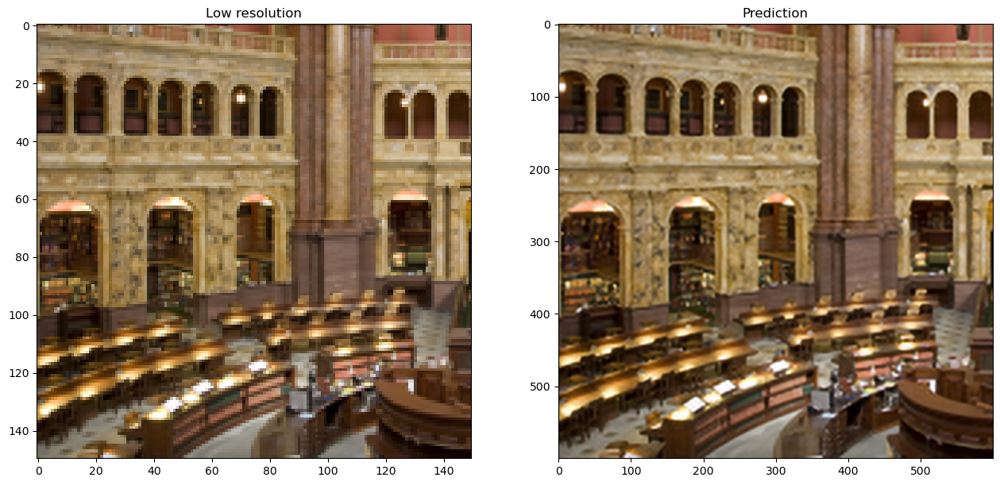

Train with Residual Blocks: 2 and Upsample method: UpSampling2D
Model: "edsr_model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 rescaling_2 (Rescaling)        (None, None, None,   0           ['input_2[0][0]']                
                                3)                                                                
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   1792        ['rescaling_2[0][0]']            
                       

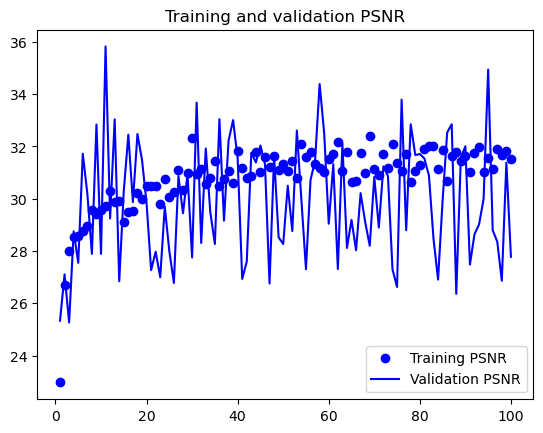

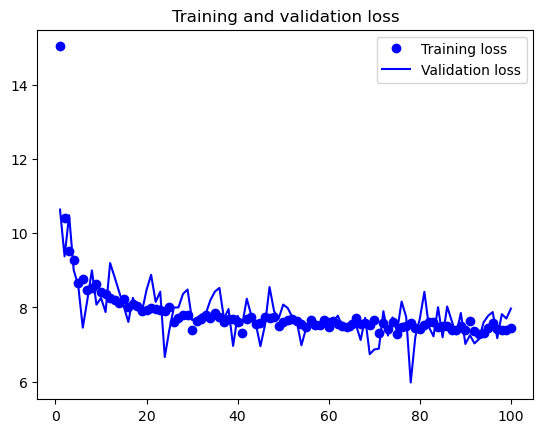

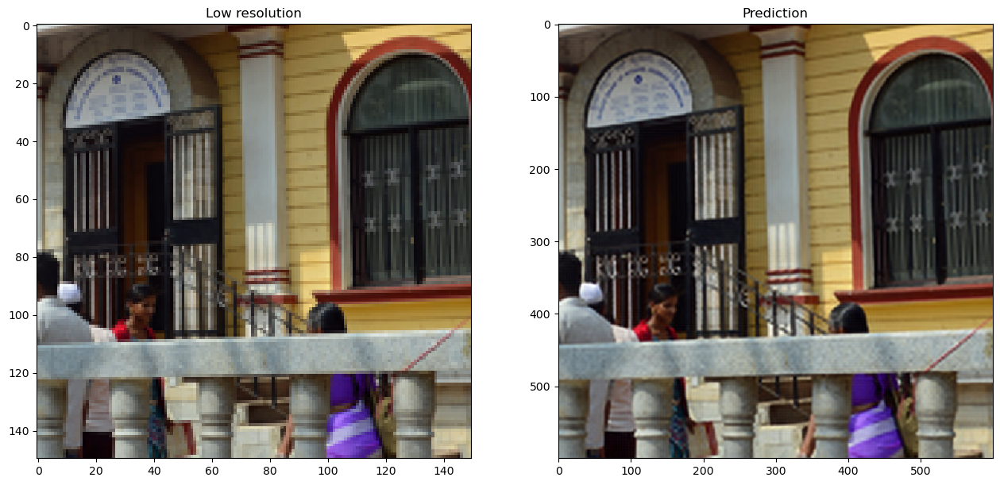

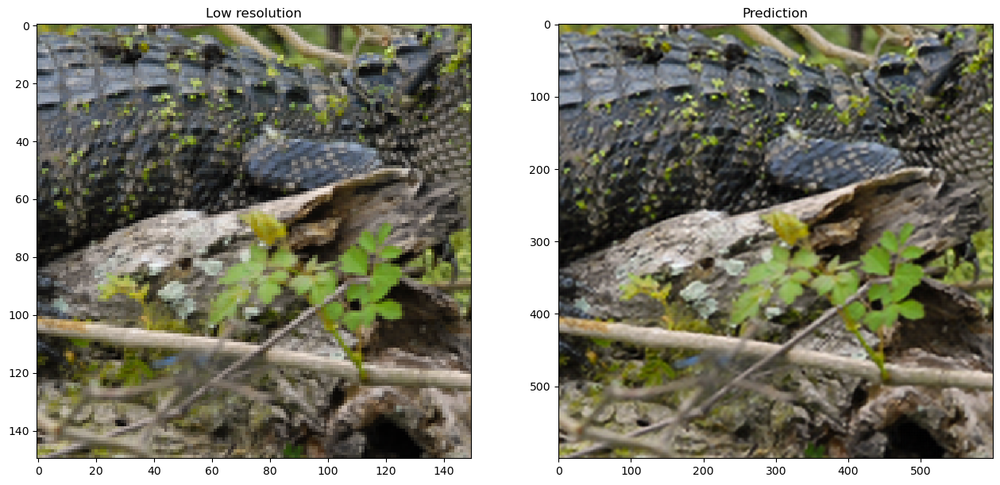

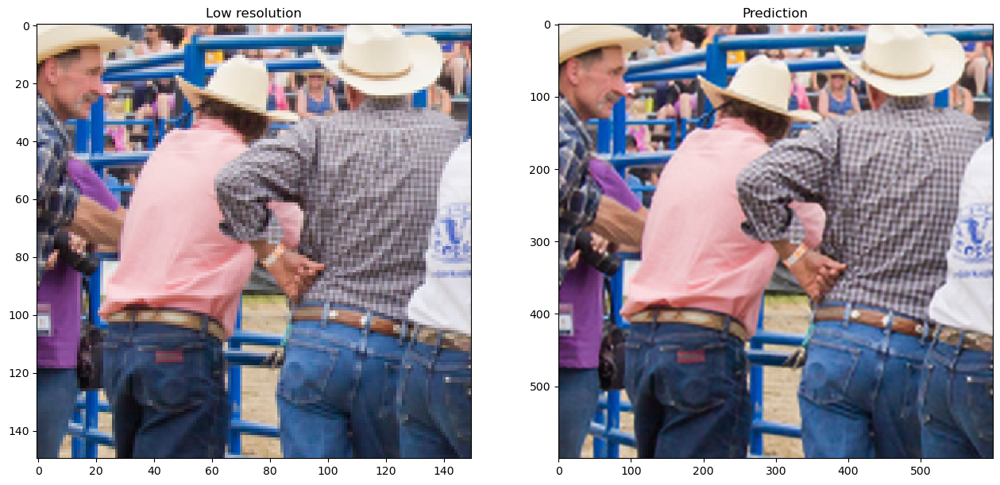

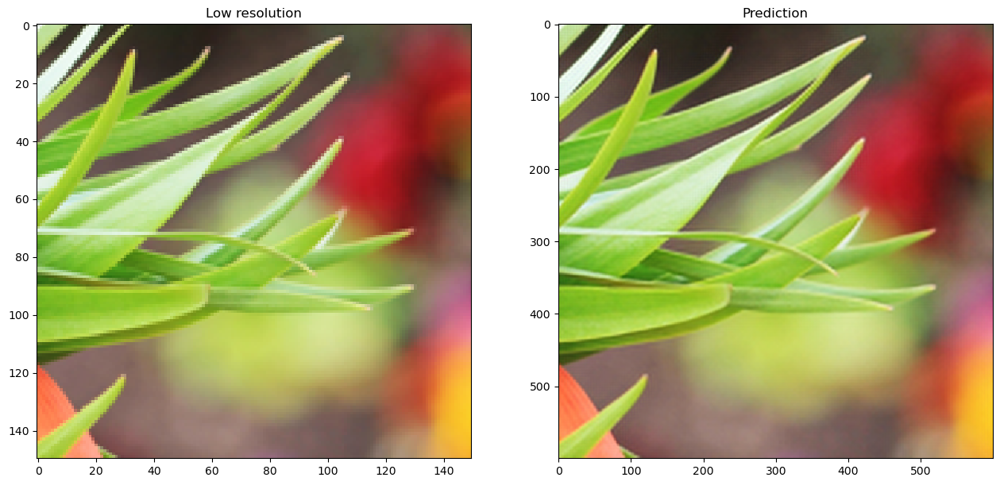

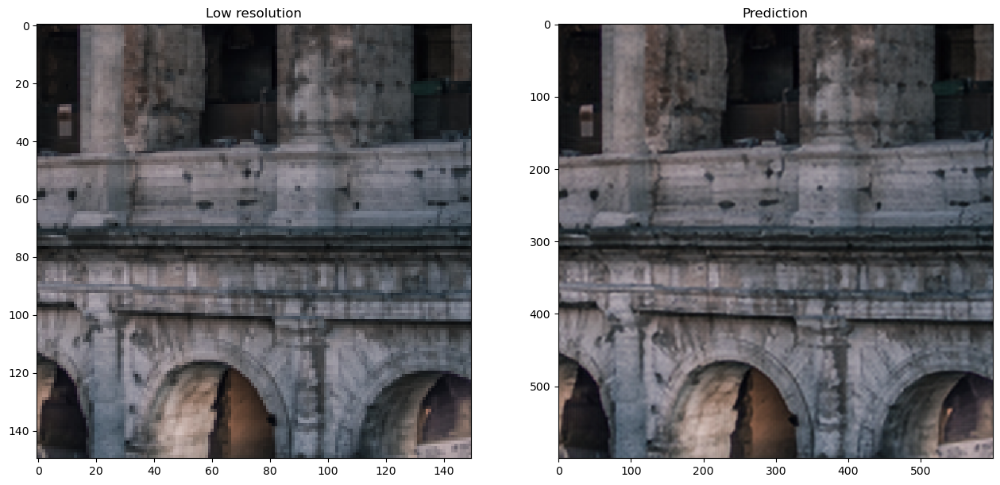

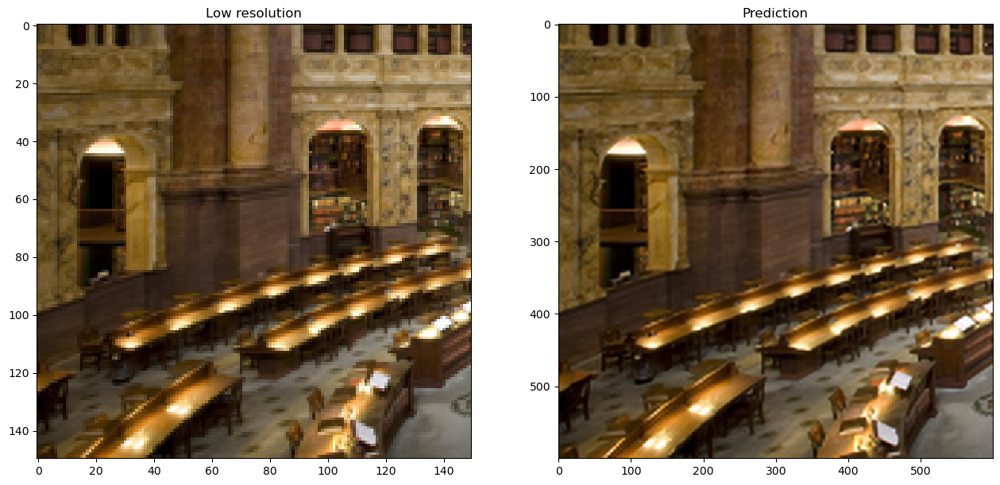

Train with Residual Blocks: 2 and Upsample method: SubPixelConv
Model: "edsr_model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 rescaling_4 (Rescaling)        (None, None, None,   0           ['input_3[0][0]']                
                                3)                                                                
                                                                                                  
 conv2d_14 (Conv2D)             (None, None, None,   1792        ['rescaling_4[0][0]']            
                       

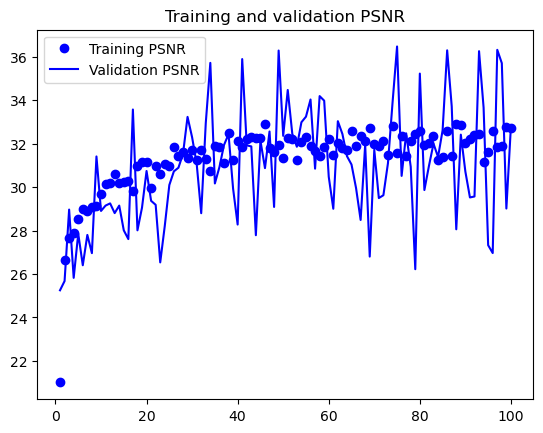

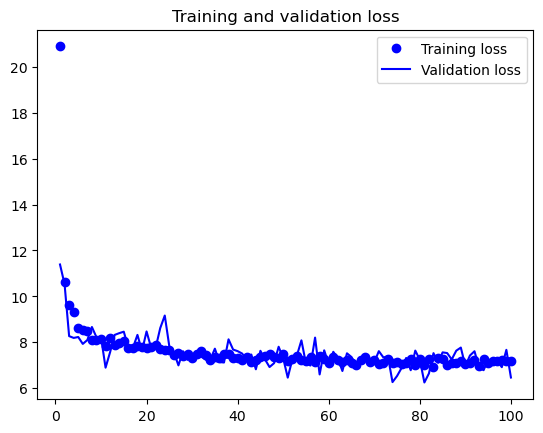

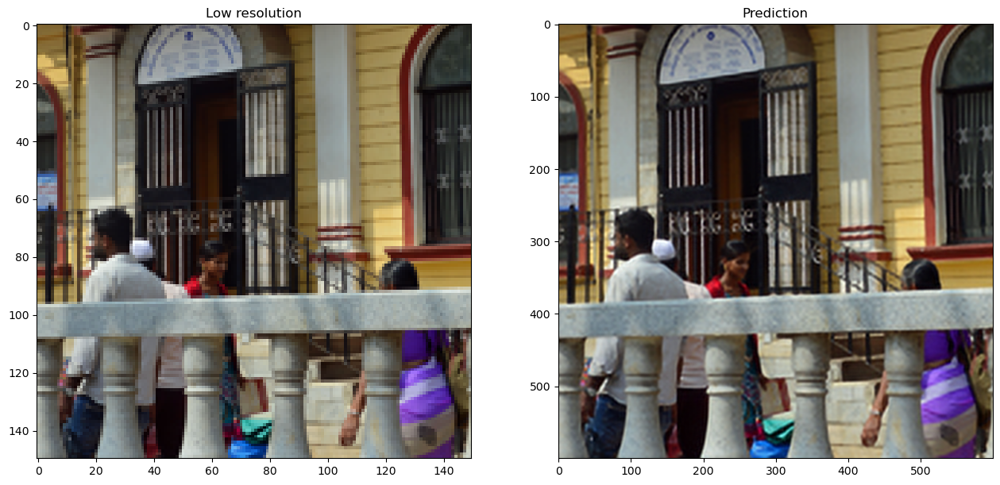

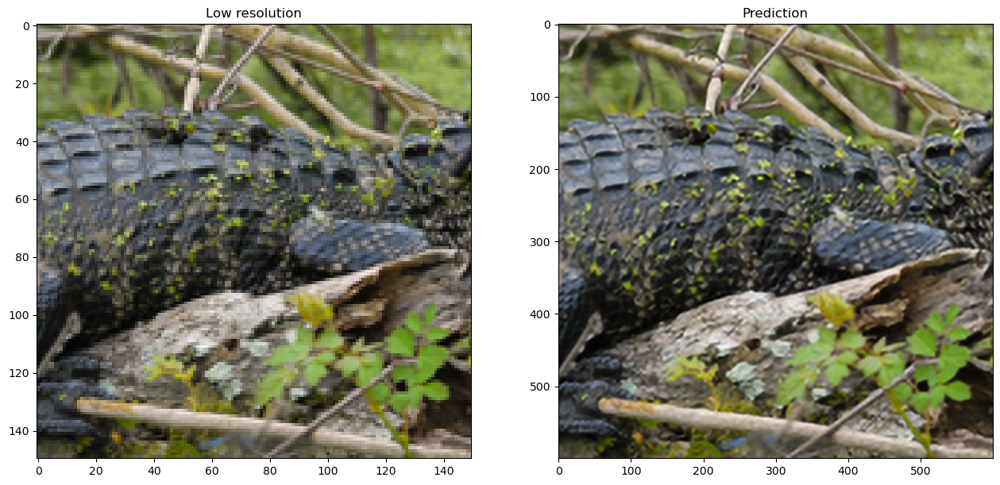

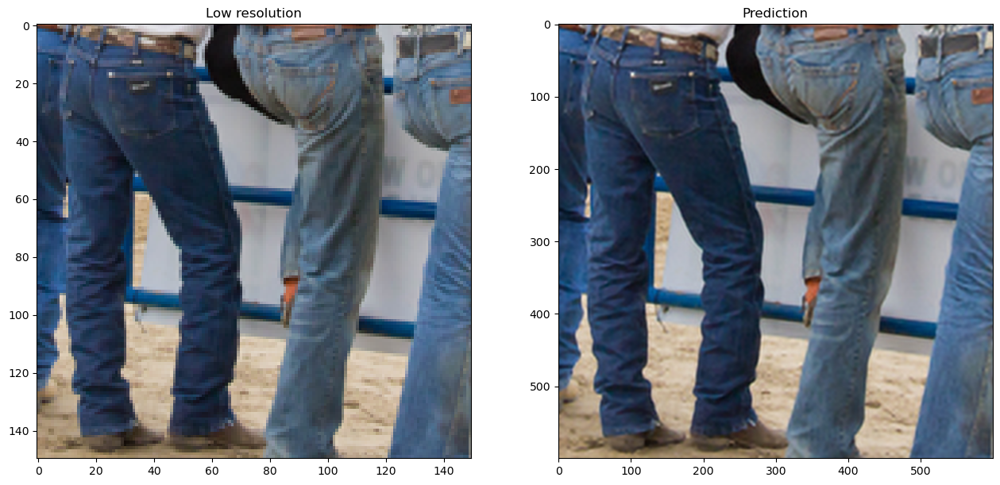

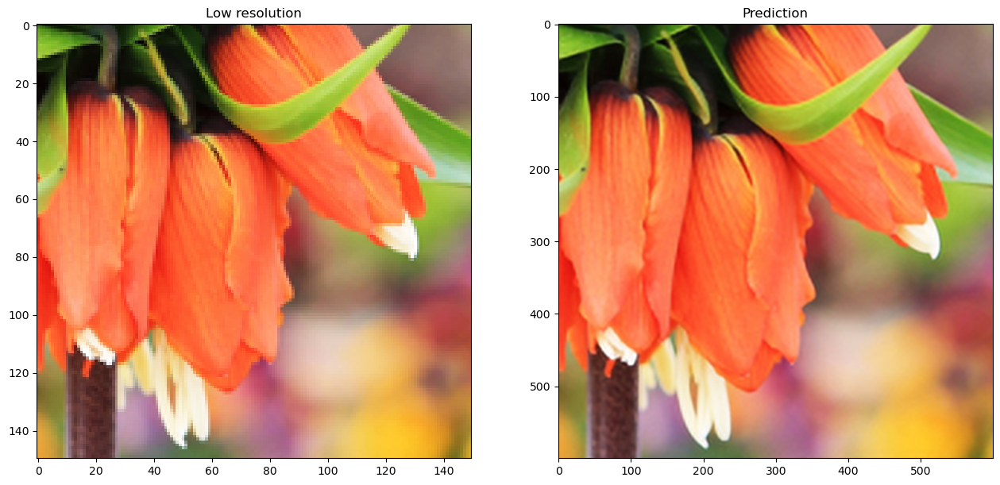

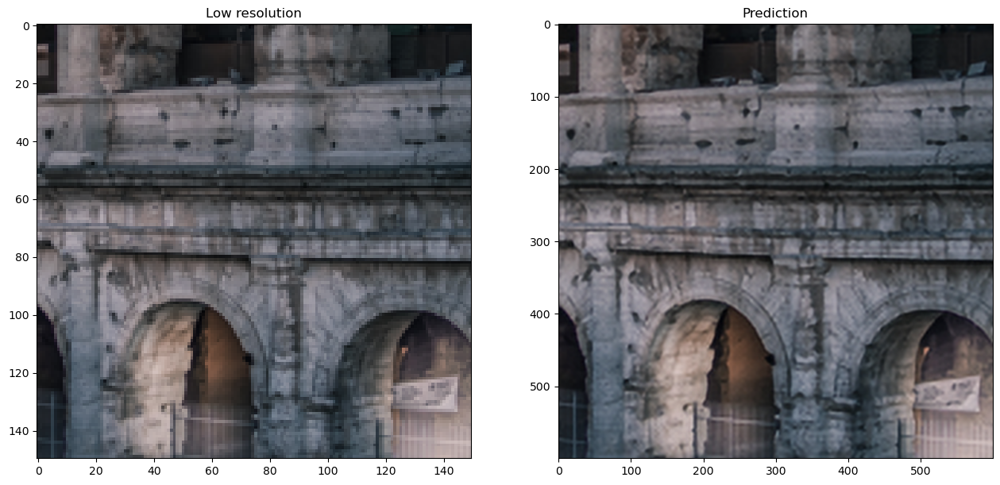

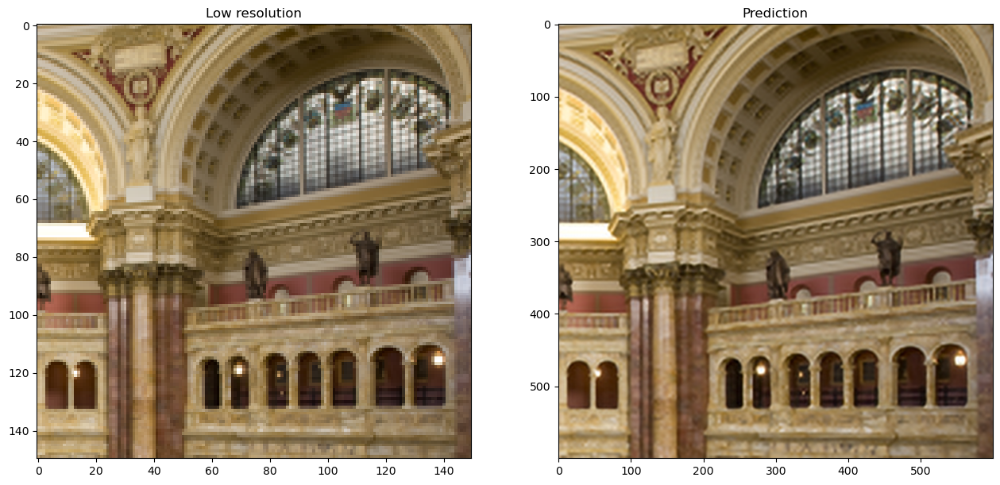

Train with Residual Blocks: 16 and Upsample method: Conv2DTranspose
Model: "edsr_model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 rescaling_6 (Rescaling)        (None, None, None,   0           ['input_4[0][0]']                
                                3)                                                                
                                                                                                  
 conv2d_23 (Conv2D)             (None, None, None,   1792        ['rescaling_6[0][0]']            
                   

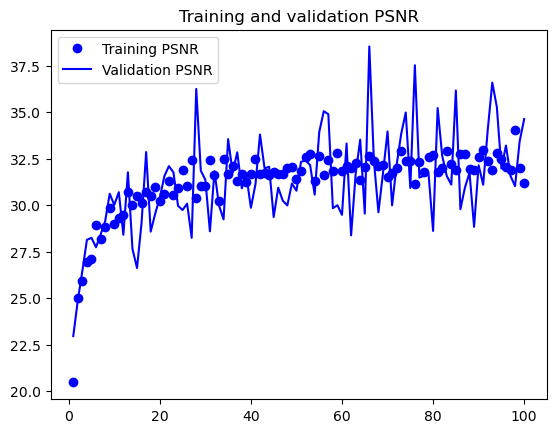

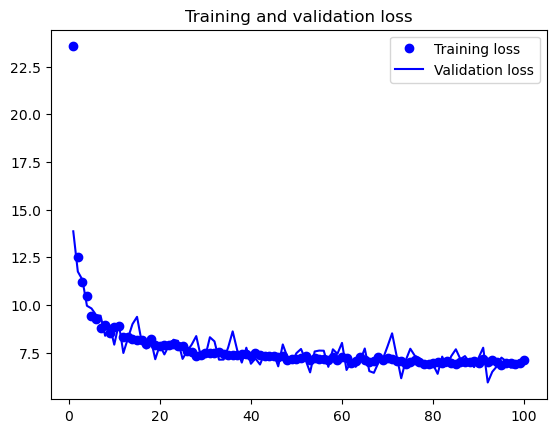

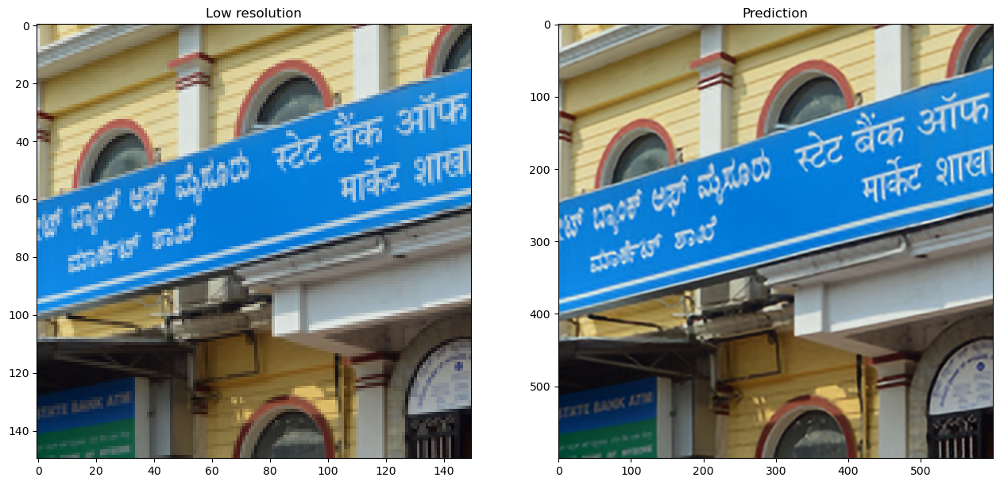

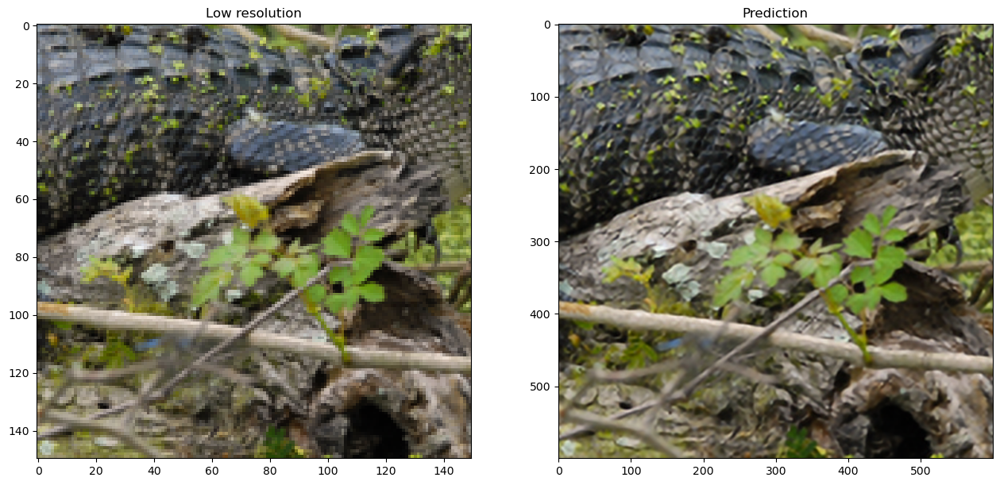

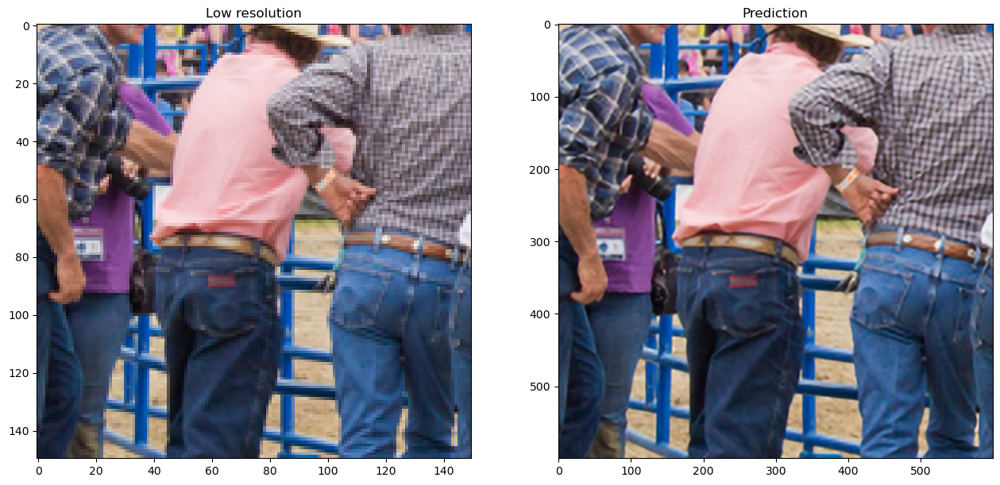

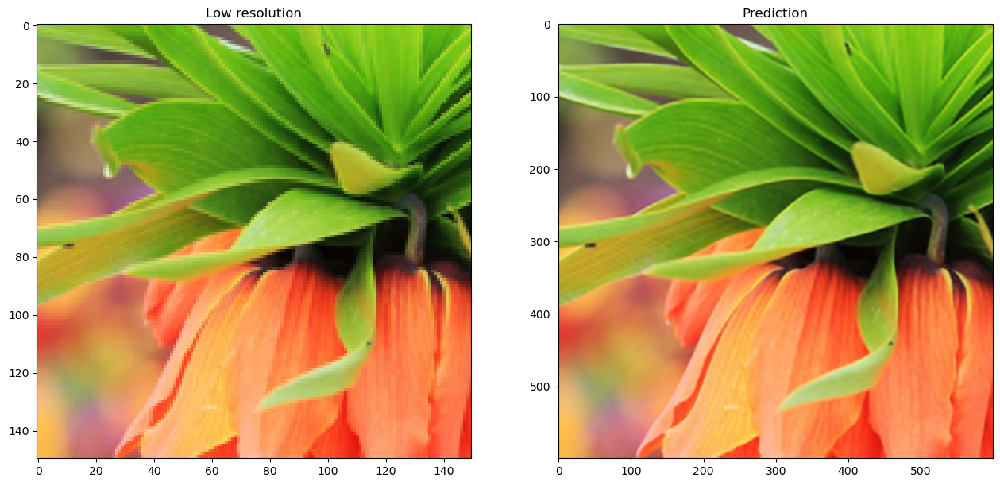

In [12]:
import time


number_residual_blocks = [2, 16]
upsample_block_types = ['Conv2DTranspose', 'UpSampling2D', 'SubPixelConv']

for nrs in number_residual_blocks:
    for ublock in upsample_block_types: 
        print (f"Train with Residual Blocks: {nrs} and Upsample method: {ublock}")
        
        model = make_model(num_filters=64, num_of_residual_blocks=nrs, upblock=ublock)
        
        # Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
        optim_edsr = keras.optimizers.Adam(
            learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
                boundaries=[5000], values=[1e-4, 5e-5]
            )
        )
        
        # print model summary
        model.summary()
        
        # Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
        model.compile(optimizer=optim_edsr, loss="mae", metrics=[PSNR])
        
        
        # Callbacks       
        model_file_path = f"Resblock{nrs}_{ublock}.keras"        
        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=model_file_path,
                save_best_only=True,
                monitor="val_PSNR",
                mode='max')
        ]
        
        # Train the model
        t0 = time.time()
        history = model.fit(
                train_ds,
                epochs=100,
                steps_per_epoch=200,
                validation_data=val_ds,
                callbacks=callbacks
        )
        
        print("Training time:", time.time()-t0)
        
        # Plot loss and psnr
        psnr = history.history["PSNR"]
        val_psnr = history.history["val_PSNR"]
        loss = history.history["loss"]
        val_loss = history.history["val_loss"]
        epochs = range(1, len(psnr) + 1)
        plt.plot(epochs, psnr, "bo", label="Training PSNR")
        plt.plot(epochs, val_psnr, "b", label="Validation PSNR")
        plt.title("Training and validation PSNR")
        plt.legend()
        plt.figure()
        plt.plot(epochs, loss, "bo", label="Training loss")
        plt.plot(epochs, val_loss, "b", label="Validation loss")
        plt.title("Training and validation loss")
        plt.legend()
        plt.show()
        
        # Show generated images
        for lowres, highres in val.take(6):
            lowres = tf.image.random_crop(lowres, (150, 150, 3))
            preds = model.predict_step(lowres)
            plot_results(lowres, preds)
